In [3]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import re
import numpy as np
from scipy.stats import ttest_ind
import math
from scipy.stats import pearsonr, spearmanr
import plotly.graph_objects as go
import plotly.express as px


In [4]:
pd.options.display.max_columns = 50


In [5]:
seed = 42

# load data

In [74]:
meta = pd.read_csv("../data/E0022_P06_final_sample_map.txt", sep='\t')

In [75]:
meta.shape

(7140, 27)

In [76]:
meta = meta[~meta['Cell_line'].str.startswith('Control_')]

In [78]:
meta.to_csv("../data/E0022_P06_final_sample_map_filtered.txt", sep='\t')

In [66]:
protein_raw = pd.read_csv("../data/protein/E0022_P06_log_transformed.tsv", sep='\t')

In [67]:
protein_raw.shape

(7140, 4021)

In [68]:
protein_median = pd.read_csv(
    "../data/protein/E0022_P06_log_transformed_median.tsv", sep='\t')

In [69]:
ic50 = pd.read_csv(
    "../data/drug/ic50_processed_median.csv")
ic50 = ic50.sort_values(by=['Dataset version'])
ic50 = ic50.drop_duplicates(
    ['Drug Id', 'Cell line name'], keep='last').sort_values(
        by=['Drug Id', 'Cell line name']).reset_index(drop=True)

# Protein avg

In [70]:
protein_raw = protein_raw.rename(columns={'Unnamed: 0': 'Automatic_MS_filename'})
protein_raw_merge = pd.merge(protein_raw, meta[['Automatic_MS_filename', 'Cell_line']])

protein_sample_avg = protein_raw_merge.drop(['Automatic_MS_filename'],
                                            axis=1).groupby(['Cell_line']).agg(np.nanmean).reset_index()

In [71]:
protein_median = protein_median.rename(columns={'Unnamed: 0': 'Automatic_MS_filename'})
protein_median_merge = pd.merge(protein_median, meta[['Automatic_MS_filename', 'Cell_line']])

protein_sample_avg_median = protein_median_merge.drop(['Automatic_MS_filename'],
                                            axis=1).groupby(['Cell_line']).agg(np.nanmean).reset_index()

In [72]:
df = protein_raw_merge[protein_raw_merge['Cell_line']=='201T']
pd.options.display.max_columns = None
display(df)

Automatic_MS_filename  1433B_HUMAN  1433E_HUMAN  \
4207  191005_b43-t1-13_00dlf_00jcq_m01_s_1     0.112525    -0.822811   
4235  191006_b45-t1-13_00dmb_00jd7_m01_s_1    -0.249758    -1.116932   
4280  191008_b45-t2-13_00dmb_00jep_m03_s_1    -0.793701    -1.345927   
4292  191008_b47-t1-13_00dn7_00jfo_m01_s_1    -0.041920    -0.472190   
4304  191009_b43-t2-13_00dlf_00jg8_m03_s_1    -0.210731    -0.785437   
4590  191017_b47-t3-13_00dn7_00kak_m04_s_1     0.026900    -0.727052   

      1433F_HUMAN  1433G_HUMAN  1433S_HUMAN  1433T_HUMAN  1433Z_HUMAN  \
4207    -0.750429     0.621545     2.228355    -0.240684     0.205880   
4235    -1.052100     0.370093     1.875280    -0.580491    -0.096783   
4280    -1.247308     0.019854     1.493373    -0.851079    -0.603476   
4292    -0.847546     0.177585     1.845457    -0.809851    -0.196277   
4304    -0.852103     0.315490     1.948026    -0.286462    -0.117343   
4590    -1.058206     0.354634     1.924331    -0.608517    -0.428179   

      1A03_HUMAN  1A24_HUMAN  2A5D_HUMAN  2A5E_HUMAN  2AAA_HUMAN  2AAB_HUMAN  \
4207         NaN         NaN   -0.109161   -0.908879   -0.020504   -1.087253   
4235         NaN         NaN    0.100835   -0.748816   -0.411187         NaN   
4280         NaN         NaN   -0.612115   -1.845085   -0.719504         NaN   
4292         NaN         NaN    0.121762         NaN   -0.268428         NaN   
4304         NaN         NaN   -0.369610   -0.642442   -0.330531   -0.955609   
4590         NaN   -5.494677    0.079644   -0.421167   -0.214785         NaN   

      2ABA_HUMAN  2B19_HUMAN  3HIDH_HUMAN  3MG_HUMAN  41_HUMAN  4ET_HUMAN  \
4207         NaN         NaN     0.638853  -1.184294       NaN        NaN   
4235    1.283811         NaN     0.147327  -0.840457 -1.885304        NaN   
4280         NaN         NaN    -0.246025  -1.145803 -2.137691        NaN   
4292         NaN         NaN     0.125503  -0.283008       NaN        NaN   
4304         NaN         NaN     0.441038  -0.500299 -1.705812        NaN   
4590         NaN    -1.11196     0.351949  -0.222518       NaN        NaN   

      4F2_HUMAN  5NT3A_HUMAN  5NTD_HUMAN  6PGD_HUMAN  6PGL_HUMAN  7B2_HUMAN  \
4207   2.005627     0.030824   -1.188819    3.747263    0.319068        NaN   
4235   1.807789    -0.272040   -1.271825    3.168674    0.174349        NaN   
4280   1.474958          NaN   -2.081783    2.709669   -0.327876        NaN   
4292   1.870305     0.249903   -1.373439    3.348284    0.400844  -0.777848   
4304   1.791553     0.431083   -1.479522    3.415227   -0.051377  -2.157372   
4590   1.652142          NaN   -1.920312    3.207013    0.241617        NaN   

      8ODP_HUMAN  A16A1_HUMAN  A2MG_HUMAN  A4_HUMAN  AAAS_HUMAN  AAAT_HUMAN  \
4207         NaN    -0.415551         NaN -0.300262   -0.092209    0.295994   
4235         NaN    -0.308806    1.227710 -0.172849   -0.203079    0.510726   
4280         NaN          NaN    2.066016 -0.408403   -0.700056   -0.149396   
4292         NaN    -0.185090    1.517113 -0.408403   -0.136246    0.452200   
4304         NaN     4.187551    1.968251  0.033788   -0.224472    0.257256   
4590   -1.325847     0.243606         NaN -0.212419   -0.681040    0.381490   

      AAGAB_HUMAN  AAK1_HUMAN  AAMDC_HUMAN  AAPK1_HUMAN  AASD1_HUMAN  \
4207    -0.296708   -1.338517          NaN     0.759626     0.063040   
4235     0.534011         NaN          NaN     0.326851    -0.776781   
4280    -0.150188         NaN          NaN    -0.037954    -1.490688   
4292     0.390441   -0.877646          NaN     1.019587    -0.137544   
4304    -0.239578   -0.995634          NaN     0.354367    -1.038120   
4590     0.144617         NaN          NaN     0.824731    -0.029476   

      AASS_HUMAN  AATC_HUMAN  AATF_HUMAN  AATM_HUMAN  AB1IP_HUMAN  \
4207         NaN    0.416338    0.324810   -0.206029          NaN   
4235         NaN    0.340026    0.042844   -0.386781          NaN   
4280         NaN    0.019130    0.304709   -0.857027     0.308683   
4292         N

In [73]:
protein_sample_avg.shape

(979, 4021)

In [12]:
protein_per = []
for col in range(1, protein_raw.shape[1]):
    protein_per.append(1 - (np.sum(np.isnan(protein_raw.iloc[:, col])) /
                            (protein_raw.shape[0])))
protein_per = np.array(protein_per)

In [13]:
protein_per_cagetory = {'fraction_of_samples': [], 'protein_count':[]}
for p in [0.01, 0.25, 0.5, 0.75, 1]:
    protein_per_cagetory['fraction_of_samples'].append(f'{p:.0%}')
    protein_per_cagetory['protein_count'].append(np.sum(protein_per>=p))
protein_per_cagetory_df = pd.DataFrame(protein_per_cagetory)

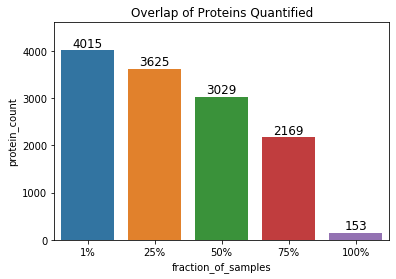

In [14]:
# Rounding the integer to the next hundredth value plus an offset of 100
def roundup(x):
    return 500 + int(math.ceil(x / 100.0)) * 100 

sns.barplot(x='fraction_of_samples', y='protein_count', data=protein_per_cagetory_df)
plt.title("Overlap of Proteins Quantified")
ax = plt.gca()

# ylim max value to be set
y_max = protein_per_cagetory_df['protein_count'].max() 
ax.set_ylim([0, roundup(y_max)])

# Iterate through the list of axes' patches
for p in ax.patches:
    ax.text(p.get_x() + p.get_width()/2., p.get_height(), '%d' % int(p.get_height()), 
            fontsize=12, color='black', ha='center', va='bottom')

plt.show()

# IC 50 EDA

Text(0, 0.5, 'Number of drugs')

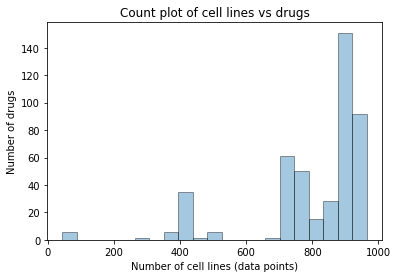

In [37]:
sns.distplot(ic50.drop_duplicates(['Drug Id', 'Cell line name'
                                   ]).groupby(['Drug Id'
                                               ]).size().sort_values(),
             kde=False,
             hist_kws=dict(edgecolor="k", linewidth=1))
plt.title('Count plot of cell lines vs drugs')
plt.xlabel("Number of cell lines (data points)")
plt.ylabel("Number of drugs")

## which drug is generally more effective 

Text(0.5, 1.0, 'Overall IC50 distribution')

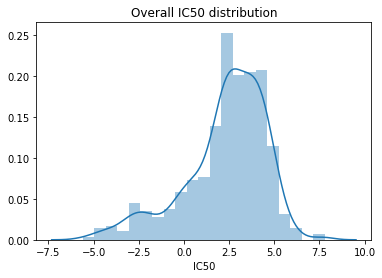

In [193]:
sns.distplot(ic50.groupby(['Drug Id'])['IC50'].mean())
plt.title("Overall IC50 distribution")

## IC50 distribution for each drug

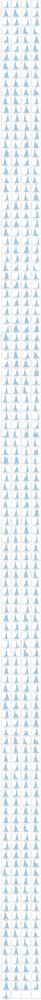

In [39]:
fig, ax = plt.subplots((ic50['Drug Id'].unique().size - 1) // 4 + 1,
                       4,
                       figsize=(15, 4 * 100))
count = 0
for drug_id in ic50['Drug Id'].unique():
    drug_id_ic50 = ic50[ic50['Drug Id'] == drug_id]['IC50'].values
    sns.distplot(drug_id_ic50, ax=ax[count // 4, count % 4], label=drug_id)
    ax[count // 4, count % 4].set_xlabel(f"Drug: {drug_id}")
    count += 1
plt.show()

## IC50 to filter drugs

In [196]:
ic50['sensitive'] = ic50['IC50'] < ic50['Max conc']

In [197]:
tmp = ic50.groupby(['Drug Id']).size().reset_index(name='cell_line_count')

In [198]:
ic50_sensitive_merge = pd.merge(
    ic50.groupby(['Drug Id']).size().reset_index(name='cell_line_count'),
    ic50.groupby(['Drug Id'
                  ])['sensitive'].sum().reset_index(name='sensitive_count'))
ic50_sensitive_merge['sensitive_ratio'] = ic50_sensitive_merge[
    'sensitive_count'] / ic50_sensitive_merge['cell_line_count']

In [199]:
ic50_sensitive_merge[ic50_sensitive_merge['sensitive_ratio'] < 0.1]

,Drug Id,cell_line_count,sensitive_count,sensitive_ratio
17,52,397,28.0,0.070529
47,150,878,6.0,0.006834
60,166,887,88.0,0.099211
85,202,877,48.0,0.054732
131,277,920,39.0,0.042391
188,408,925,54.0,0.058378
214,562,915,56.0,0.061202
310,1200,764,12.0,0.015707
326,1262,909,7.0,0.007701
327,1263,894,29.0,0.032438


In [200]:
fig = px.scatter(ic50_sensitive_merge,
                 x="cell_line_count",
                 y="sensitive_ratio",
                 hover_name='Drug Id')
fig.show()

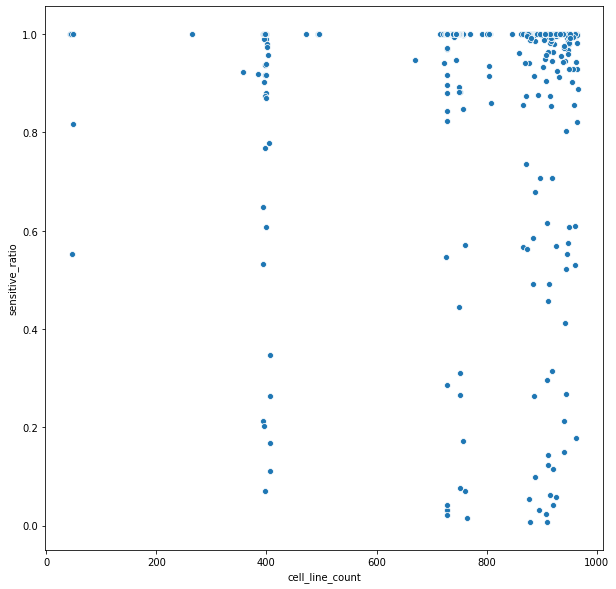

In [206]:
plt.figure(figsize=(10,10))
sns.scatterplot(x='cell_line_count',
                y='sensitive_ratio',
                data=ic50_sensitive_merge)

# RNA data

## raw

In [51]:
name_map = pd.read_csv("../data/misc/HUMAN_9606_idmapping.gene_prot.dat",
                       sep='\t',
                       names=['ID', 'type', 'code'])
name_map = name_map.drop_duplicates(['ID', 'type'])
name_map = pd.pivot(name_map, index='ID', columns='type', values='code').dropna()

In [52]:
name_map_dict = dict(zip(name_map['UniProtKB-ID'].values, name_map['Gene_Name'].values))

In [53]:
rna_raw = pd.read_csv("../data/rna/rnaseq_voom.csv", index_col=0).T

rna_raw.index.name='SIDM'

rna_raw = rna_raw.reset_index()

In [54]:
'H4C2' in rna_raw

False

In [55]:
rna_sample = pd.merge(rna_raw,
                      meta[['SIDM',
                            'Cell_line']].drop_duplicates()).drop(['SIDM'],
                                                                  axis=1)

In [56]:
corr_dict = {}
gene_not_found = []
protein_not_found = []
for protein in protein_sample_avg.drop(['Cell_line'], axis=1).columns:
    if protein not in name_map_dict:
        protein_not_found.append(protein)
        continue
    gene = name_map_dict[protein]
    if gene in rna_sample.columns:
        data = pd.merge(protein_sample_avg[['Cell_line', protein]],
                        rna_sample[['Cell_line', gene]])
        data = data.dropna()
        corr_dict[protein] = spearmanr(data.iloc[:, 1], data.iloc[:, 2])[0]


In [57]:
protein_not_found

['1A03_HUMAN',
 '1A24_HUMAN',
 '2B19_HUMAN',
 'Biognosys',
 'C43BP_HUMAN',
 'CCD51_HUMAN',
 'CTR1_HUMAN',
 'LT_SV40',
 'NACP1_HUMAN',
 'NIBAN_HUMAN',
 'NIBL1_HUMAN',
 'PCSK1_HUMAN',
 'RMIS_protein',
 'RMISv2',
 'RMISv3',
 'SYHC_HUMAN',
 'TMEM2_HUMAN',
 'sp|P49327|FAS_HUMAN',
 'sp|P78527|PRKDC_HUMAN',
 'sp|Q00610|CLH1_HUMAN',
 'sp|Q13813|SPTN1_HUMAN',
 'sp|Q14204|DYHC1_HUMAN']

In [54]:
np.median(list(corr_dict.values()))

0.30372884861700616

Text(-0.48346807570447387, 200, 'Median: 0.3037')

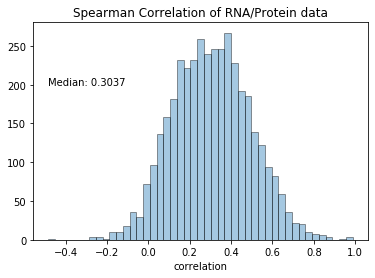

In [89]:
sns.distplot(list(corr_dict.values()),
             kde=False,
             hist_kws=dict(edgecolor="k", linewidth=1))
plt.title("Spearman Correlation of RNA/Protein data")
plt.xlabel("correlation")
plt.text(np.min(list(corr_dict.values())), 200,
         f"Median: {np.median(list(corr_dict.values())):.4f}")

## median normalised

In [174]:
name_map = pd.read_csv("../data/misc/HUMAN_9606_idmapping.gene_prot.dat",
                       sep='\t',
                       names=['ID', 'type', 'code'])
name_map = name_map.drop_duplicates(['ID', 'type'])
name_map = pd.pivot(name_map, index='ID', columns='type', values='code').dropna()

In [175]:
name_map_dict = dict(zip(name_map['UniProtKB-ID'].values, name_map['Gene_Name'].values))

In [176]:
rna_raw = pd.read_csv("../data/rna/rnaseq_voom.csv", index_col=0).T

rna_raw.index.name='SIDM'

rna_raw = rna_raw.reset_index()

In [177]:
rna_sample = pd.merge(rna_raw,
                      meta[['SIDM',
                            'Cell_line']].drop_duplicates()).drop(['SIDM'],
                                                                  axis=1)

In [178]:
corr_dict = {}
gene_not_found = []
protein_not_found = []
for protein in protein_sample_avg_median.drop(['Cell_line'], axis=1).columns:
    if protein not in name_map_dict:
        protein_not_found.append(protein)
        continue
    gene = name_map_dict[protein]
    if gene in rna_sample.columns:
        data = pd.merge(protein_sample_avg_median[['Cell_line', protein]],
                        rna_sample[['Cell_line', gene]])
        data = data.dropna()
        corr_dict[protein] = spearmanr(data.iloc[:, 1], data.iloc[:, 2])[0]


In [179]:
np.median(list(corr_dict.values()))

0.38271037914024275

Text(-0.4531474881069638, 200, 'Median: 0.3827')

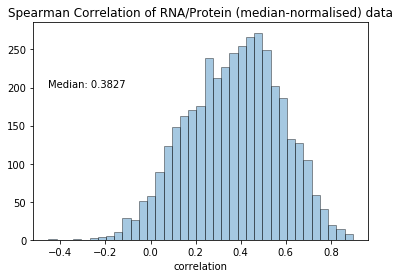

In [181]:
sns.distplot(list(corr_dict.values()),
             kde=False,
             hist_kws=dict(edgecolor="k", linewidth=1))
plt.title("Spearman Correlation of RNA/Protein (median-normalised) data")
plt.xlabel("correlation")
plt.text(np.min(list(corr_dict.values())), 200,
         f"Median: {np.median(list(corr_dict.values())):.4f}")

## correlation by tissue-type

In [182]:
ic50_by_tissue = ic50_selected[['Drug Id', 'Cell line name','Tissue', 'IC50_norm']].drop_duplicates()

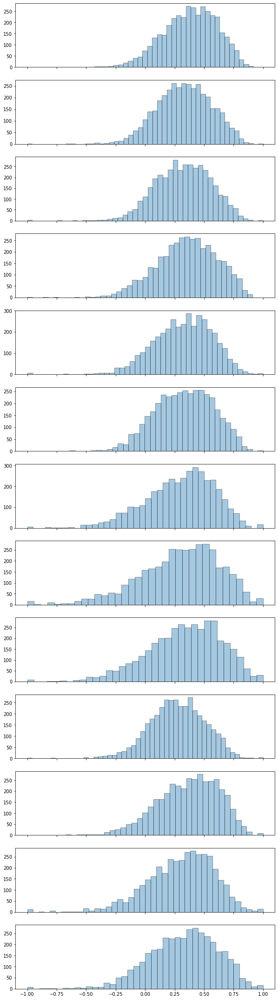

In [183]:
all_corr = []
fig, ax = plt.subplots(ic50_by_tissue['Tissue'].unique().size,
                       1,
                       figsize=(10,
                                3 * ic50_by_tissue['Tissue'].unique().size),
                       sharex=True)
count = 0
for tissue in ic50_by_tissue['Tissue'].unique():
    tissue_cell_line = ic50_by_tissue[ic50_by_tissue['Tissue'] ==
                                      tissue]['Cell line name'].unique()
    protein_sample_avg_tissue = protein_sample_avg_median[
        protein_sample_avg_median['Cell_line'].isin(tissue_cell_line)]
    corr_dict = {}
    protein_not_found = []
    for protein in protein_sample_avg_tissue.drop(['Cell_line'],
                                                  axis=1).columns:
        if protein not in name_map_dict:
            protein_not_found.append(protein)
            continue
        gene = name_map_dict[protein]
        if gene in rna_sample.columns:
            data = pd.merge(protein_sample_avg_tissue[['Cell_line', protein]],
                            rna_sample[['Cell_line', gene]])
            data = data.dropna()
            corr = spearmanr(data.iloc[:, 1], data.iloc[:, 2])[0]
            if not np.isnan(corr):
                corr_dict[protein] = corr
                all_corr.append({
                    'tissue': tissue,
                    'protein': protein,
                    'corr': corr
                })

    sns.distplot(list(corr_dict.values()),
                 kde=False,
                 hist_kws=dict(edgecolor="k", linewidth=1),
                 ax=ax[count])
    count += 1

all_corr_df = pd.DataFrame(all_corr)

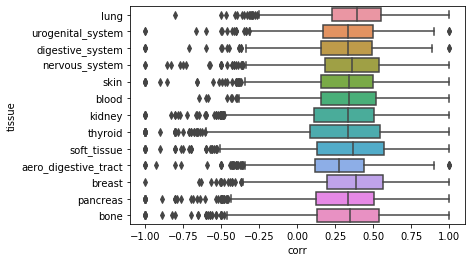

In [185]:
sns.boxplot(x='corr', y='tissue', data=all_corr_df)

# Missing value analysis

In [14]:
protein_raw_merge.head()

,Automatic_MS_filename,1433B_HUMAN,1433E_HUMAN,1433F_HUMAN,1433G_HUMAN,1433S_HUMAN,1433T_HUMAN,1433Z_HUMAN,1A03_HUMAN,1A24_HUMAN,2A5D_HUMAN,2A5E_HUMAN,2AAA_HUMAN,2AAB_HUMAN,2ABA_HUMAN,2B19_HUMAN,3HIDH_HUMAN,3MG_HUMAN,41_HUMAN,4ET_HUMAN,4F2_HUMAN,5NT3A_HUMAN,5NTD_HUMAN,6PGD_HUMAN,6PGL_HUMAN,...,ZN384_HUMAN,ZN428_HUMAN,ZN512_HUMAN,ZN593_HUMAN,ZN598_HUMAN,ZN622_HUMAN,ZN638_HUMAN,ZN687_HUMAN,ZN706_HUMAN,ZN768_HUMAN,ZNF22_HUMAN,ZNF24_HUMAN,ZNT9_HUMAN,ZO1_HUMAN,ZO2_HUMAN,ZPR1_HUMAN,ZRAB2_HUMAN,ZW10_HUMAN,ZYX_HUMAN,sp|P49327|FAS_HUMAN,sp|P78527|PRKDC_HUMAN,sp|Q00610|CLH1_HUMAN,sp|Q13813|SPTN1_HUMAN,sp|Q14204|DYHC1_HUMAN,Cell_line
0,180329_e0022_p01_2051_1_s_m06_1,1.366712,-0.379017,0.145958,0.020725,0.706700,0.215300,1.194450,NaN,NaN,-0.029726,0.154886,0.477217,0.916291,NaN,NaN,0.252528,0.795035,NaN,-0.881310,1.030531,NaN,-0.941702,0.719571,0.345937,...,-0.246869,NaN,-0.928893,-0.195719,-0.500429,NaN,-0.094780,1.051272,0.418838,NaN,NaN,-1.219555,0.456181,-0.144373,0.839440,-0.446742,-0.593657,0.636341,0.026846,0.769756,0.430933,0.569526,1.575045,0.611558,RT-112
1,180329_e0022_p01_2051_2_s_m06_1,1.216321,-0.165864,0.026386,0.141515,0.772427,0.369221,1.224733,NaN,NaN,-0.153385,0.354854,0.548241,-0.228214,NaN,NaN,0.380532,0.152210,-1.257071,-0.850431,0.929658,NaN,-1.086459,0.691274,0.477440,...,0.127460,-1.652202,NaN,-0.211240,-0.594258,-0.989036,-0.121968,0.963772,0.359465,-1.173845,NaN,-2.510730,0.203879,-0.222617,0.846809,-0.456315,-0.532285,0.473204,0.074372,0.739575,0.420686,0.644488,1.519512,0.639871,RT-112
2,180329_e0022_p01_2051_3_s_m06_1,1.512553,-0.094112,0.338224,-0.231715,0.392807,0.341544,1.033066,NaN,NaN,0.600706,0.411879,0.393375,-0.487056,-0.522923,NaN,0.339695,0.496061,-1.650331,NaN,0.817986,NaN,-1.060048,0.244787,0.151905,...,-0.079844,NaN,NaN,-0.607434,-0.934413,-0.470954,-0.414581,0.817730,-0.353114,NaN,NaN,-1.105871,0.153697,-0.227938,0.523833,-0.643200,-0.791797,0.921086,-0.208231,1.061711,0.750340,0.916700,1.419850,0.745835,RT-112
3,180329_e0022_p01_2098_1_s_m06_1,1.182712,1.336629,1.067884,0.462023,0.118597,1.471258,1.191380,NaN,1.787231,0.753880,0.719914,0.937260,1.248045,0.311679,NaN,1.479054,0.017236,-1.675660,NaN,-0.004009,NaN,1.574780,0.793619,0.932350,...,0.251650,-0.537382,0.088552,0.246579,-0.375355,-0.387527,0.780370,NaN,-0.022820,NaN,0.804539,-0.324155,0.032561,0.641217,0.582013,0.653656,-0.253880,0.604116,0.907799,1.974982,0.863071,1.461805,1.100506,1.767590,SK-HEP-1
4,180329_e0022_p01_2098_2_s_m06_1,0.760195,0.959274,0.667517,0.555434,-0.284466,1.053615,0.580849,NaN,0.472755,0.162919,0.951271,0.754193,0.578128,-0.393581,NaN,0.762630,-0.040463,NaN,NaN,-0.441779,NaN,1.160184,0.360797,0.640828,...,-0.164113,-1.281691,-0.851221,-0.184430,NaN,NaN,0.523899,0.310488,0.408153,NaN,0.117203,-1.774091,NaN,0.288593,0.620631,0.532498,-0.205474,0.415667,0.656514,1.251139,0.040918,0.749182,0.840511,1.411439,SK-HEP-1


In [142]:
protein_raw_merge[protein_raw_merge['Cell_line']=='SK-CO-1']

Automatic_MS_filename  1433B_HUMAN  1433E_HUMAN  \
709             181025_e0022_p02_4072_1_s_m06_1    -1.123516    -1.589471   
710             181025_e0022_p02_4072_2_s_m06_1    -0.518345    -0.868429   
711             181025_e0022_p02_4072_3_s_m06_1    -0.797780    -1.406128   
781             181102_e0022_p02_4072_1_s_m04_1    -0.492987    -0.717164   
782             181102_e0022_p02_4072_2_s_m04_1     0.811876    -0.808477   
783             181102_e0022_p02_4072_3_s_m04_1    -0.052480    -0.351450   
2218  190507_e0022-p02-4072_008i6_00aq3_m03_s_1    -0.539695    -0.969397   
3042  190623_e0022-p02-4072_008i6_00csl_m05_s_1    -0.233977    -1.062187   

      1433F_HUMAN  1433G_HUMAN  1433S_HUMAN  1433T_HUMAN  1433Z_HUMAN  \
709     -1.254486    -1.931698    -0.517445    -1.847542    -1.261857   
710     -1.056510    -1.496473     0.060214    -1.240438    -0.533923   
711     -1.303484    -2.002826    -0.389094    -1.581552    -0.887847   
781     -0.819345    -0.809539    -0.152275    -0.660569    -0.480652   
782     -0.056425    -0.201546     0.797006    -0.111680     0.467633   
783     -0.398033    -0.390949     0.096450    -0.510272     0.233428   
2218    -1.033678    -0.906506     0.222005    -0.997312     0.094879   
3042    -0.828773    -0.529659     0.438694    -0.602897     0.153818   

      1A03_HUMAN  1A24_HUMAN  2A5D_HUMAN  2A5E_HUMAN  2AAA_HUMAN  2AAB_HUMAN  \
709          NaN         NaN         NaN   -0.777767   -1.608355   -2.162796   
710          NaN         NaN         NaN   -0.742490   -1.089751   -1.439360   
711          NaN         NaN         NaN   -1.275190   -1.446109         NaN   
781          NaN         NaN         NaN    0.655939   -0.516780   -0.738018   
782          NaN         NaN         NaN    0.127580    0.097227   -0.050957   
783          NaN         NaN   -0.341425    0.610794   -0.399522   -0.433507   
2218         NaN         NaN         NaN   -0.490902   -0.975850         NaN   
3042         NaN         NaN         NaN    0.157438   -0.416346   -1.273350   

      2ABA_HUMAN  2B19_HUMAN  3HIDH_HUMAN  3MG_HUMAN  41_HUMAN  4ET_HUMAN  \
709    -2.728868         NaN    -1.919160        NaN       NaN  -1.246733   
710          NaN         NaN    -1.765564  -2.569602       NaN  -1.373151   
711          NaN         NaN    -1.776844        NaN       NaN  -1.495393   
781          NaN         NaN    -0.505318  -1.315084       NaN        NaN   
782    -1.991281         NaN    -0.155400  -0.145803       NaN        NaN   
783          NaN         NaN    -0.293529  -3.320889 -3.049252        NaN   
2218   -1.948882         NaN    -0.852002        NaN       NaN        NaN   
3042         NaN         NaN    -0.667006  -1.506901       NaN        NaN   

      4F2_HUMAN  5NT3A_HUMAN  5NTD_HUMAN  6PGD_HUMAN  6PGL_HUMAN  7B2_HUMAN  \
709   -2.188738          NaN   -2.647201   -2.828172   -2.677168        NaN   
710   -1.942665          NaN   -2.172685   -2.129199   -2.138620        NaN   
711   -2.029992          NaN   -2.485181   -2.320617   -2.532870        NaN   
781   -0.821375          NaN   -0.779863   -1.821755   -0.871903        NaN   
782   -0.482617          NaN   -0.519735   -1.008625   -0.454043        NaN   
783   -0.496750          NaN   -0.732699   -1.184412   -0.683668        NaN   
2218  -1.435401          NaN   -1.728338   -1.832977   -1.548737        NaN   
3042  -0.947262          NaN   -1.278760   -1.370953   -1.083305        NaN   

      8ODP_HUMAN  A16A1_HUMAN  A2MG_HUMAN  A4_HUMAN  AAAS_HUMAN  AAAT_HUMAN  \
709          NaN    -2.228000         NaN -0.314034   -1.387414   -1.435641   
710          NaN    -1.513758         NaN  0.105316   -1.163263   -1.151049   
711          NaN    -2.756298         NaN -0.355669   -1.344191   -1.462405   
781          NaN    -1.585350         NaN  0.466849    0.782223    0.081772   
782          NaN    -0.224179         NaN  1.344486    0.720716    0.329771   
783          NaN    -0.587641         NaN  1.236198    0.821076   -0.0771

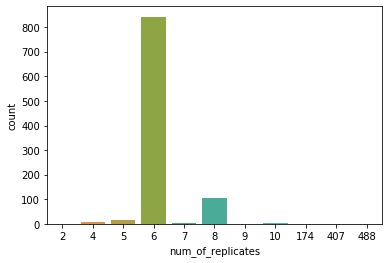

In [15]:
sns.countplot(
    protein_raw_merge.groupby([
        'Cell_line'
    ]).size().reset_index(name='num_of_replicates')['num_of_replicates'])

In [16]:
protein_raw_merge_rep_num = protein_raw_merge.groupby(
    ['Cell_line']).size().reset_index(name='num_of_replicates')

In [17]:
protein_raw_merge_six_rep = protein_raw_merge[
    protein_raw_merge['Cell_line'].isin(protein_raw_merge_rep_num[
        protein_raw_merge_rep_num['num_of_replicates'] == 6]['Cell_line'])]

In [ ]:
protein_na_count = protein_raw_merge_six_rep.groupby(['Cell_line']).agg(lambda x:np.sum(np.isnan(x)))

In [ ]:
protein_na_count = protein_na_count.astype(int)

In [19]:
# protein_na_count.to_csv("../data/protein/protein_na_count_E06.csv")
protein_na_count = pd.read_csv("../data/protein/protein_na_count_E06.csv")

In [20]:
protein_na_count_melt = pd.melt(protein_na_count.reset_index(),
                                id_vars='Cell_line',
                                value_name='na_count',
                                var_name='protein')

In [21]:
protein_raw_merge_melt = pd.melt(
    protein_raw_merge,
    id_vars=['Automatic_MS_filename', 'Cell_line'],
    value_name='expression',
    var_name='protein')

In [22]:
protein_raw_merge_melt_na_count = pd.merge(
    protein_raw_merge_melt,
    protein_na_count_melt,
    on=['Cell_line', 'protein']).dropna()

In [161]:
tmp = pd.merge(protein_raw_merge_melt,
               protein_na_count_melt[protein_na_count_melt['na_count'] == 5],
               on=['Cell_line', 'protein']).dropna()

In [23]:
all_protein_exp = protein_raw.drop(['Automatic_MS_filename'], axis=1).values.flatten()
all_protein_exp = all_protein_exp[~np.isnan(all_protein_exp)]

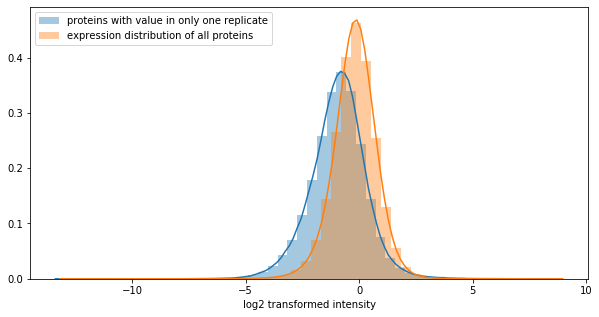

In [163]:
plt.figure(figsize=(10,5))
sns.distplot(tmp['expression'], label='proteins with value in only one replicate')
sns.distplot(all_protein_exp, label='expression distribution of all proteins')

plt.legend()
plt.xlabel("log2 transformed intensity")
plt.show()

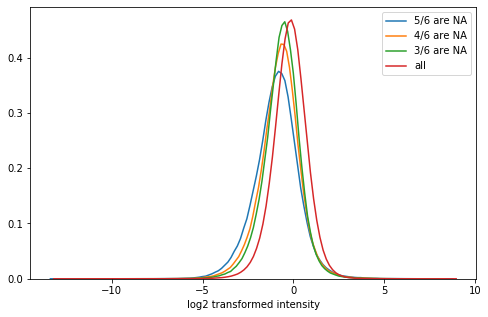

In [166]:
plt.figure(figsize=(8, 5))
sns.distplot(protein_raw_merge_melt_na_count[
    protein_raw_merge_melt_na_count['na_count'] == 5]['expression'],
             label='5/6 are NA',
             hist=False)
sns.distplot(protein_raw_merge_melt_na_count[
    protein_raw_merge_melt_na_count['na_count'] == 4]['expression'],
             label='4/6 are NA',
             hist=False)
sns.distplot(protein_raw_merge_melt_na_count[
    protein_raw_merge_melt_na_count['na_count'] == 3]['expression'],
             label='3/6 are NA',
             hist=False)
sns.distplot(all_protein_exp, label='all', hist=False)

plt.legend()
plt.xlabel("log2 transformed intensity")
plt.show()

In [46]:
tmp = protein_raw_merge_melt_na_count[
    protein_raw_merge_melt_na_count['na_count'] == 3]
tmp = tmp.groupby(['Cell_line','protein'])['expression'].agg(['std','mean'])


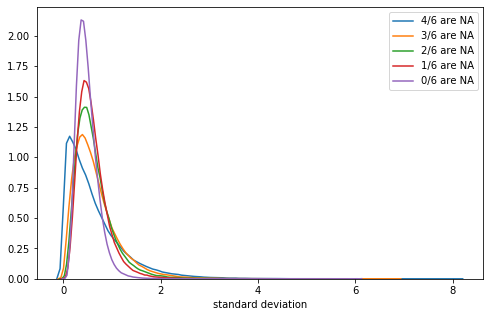

In [49]:
plt.figure(figsize=(8, 5))

tmp = protein_raw_merge_melt_na_count[
    protein_raw_merge_melt_na_count['na_count'] == 4]
tmp = tmp.groupby(['Cell_line','protein'])['expression'].std().reset_index()
sns.distplot(tmp['expression'], label='4/6 are NA', hist=False)
tmp = protein_raw_merge_melt_na_count[
    protein_raw_merge_melt_na_count['na_count'] == 3]
tmp = tmp.groupby(['Cell_line','protein'])['expression'].std().reset_index()
sns.distplot(tmp['expression'], label='3/6 are NA', hist=False)
tmp = protein_raw_merge_melt_na_count[
    protein_raw_merge_melt_na_count['na_count'] == 2]
tmp = tmp.groupby(['Cell_line','protein'])['expression'].std().reset_index()
sns.distplot(tmp['expression'], label='2/6 are NA', hist=False)
tmp = protein_raw_merge_melt_na_count[
    protein_raw_merge_melt_na_count['na_count'] == 1]
tmp = tmp.groupby(['Cell_line','protein'])['expression'].std().reset_index()
sns.distplot(tmp['expression'], label='1/6 are NA', hist=False)
tmp = protein_raw_merge_melt_na_count[
    protein_raw_merge_melt_na_count['na_count'] == 0]
tmp = tmp.groupby(['Cell_line','protein'])['expression'].std().reset_index()
sns.distplot(tmp['expression'], label='0/6 are NA', hist=False)

plt.legend()
plt.xlabel("standard deviation")
plt.show()

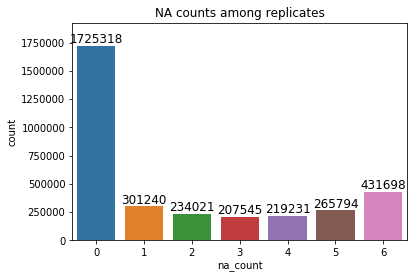

In [167]:
def roundup(x):
    return 200000 + int(math.ceil(x / 100.0)) * 100


df = protein_na_count_melt[(protein_na_count_melt['na_count'] >= 0)
                           & (protein_na_count_melt['na_count'] <= 6)]

sns.countplot(df['na_count'])

# Get current axis on current figure
ax = plt.gca()

# ylim max value to be set
y_max = df['na_count'].value_counts().max()
ax.set_ylim([0, roundup(y_max)])

# Iterate through the list of axes' patches
for p in ax.patches:
    ax.text(p.get_x() + p.get_width() / 2.,
            p.get_height(),
            '%d' % int(p.get_height()),
            fontsize=12,
            color='black',
            ha='center',
            va='bottom')
plt.title("NA counts among replicates")
plt.show()

In [189]:
protein_raw_na_count = pd.isna(protein_raw).sum()
protein_raw_na_count = protein_raw_na_count[1:]

Text(0, 0.5, 'counts')

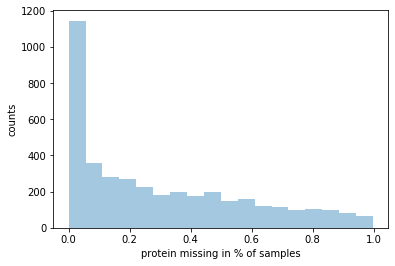

In [192]:
sns.distplot(protein_raw_na_count / protein_raw.shape[0], kde=False)
plt.xlabel("protein missing in % of samples")
plt.ylabel("counts")

# cluster by tissue type

In [78]:
ic50_counts = ic50.groupby(['Drug Id']).size()
selected_drugs = ic50_counts[ic50_counts > 900].index.values
ic50_selected = ic50[ic50['Drug Id'].isin(selected_drugs)]

In [128]:
ic50_selected_meta = pd.merge(ic50_selected, meta, left_on=['Cell line name'], right_on=['Cell_line'])

ic50_by_tissue_meta = ic50_selected_meta[['Drug Id', 'Cell line name','Tissue_type', 'IC50_norm']].drop_duplicates()
ic50_by_tissue_meta = ic50_by_tissue_meta.groupby(['Drug Id', 'Tissue_type'])['IC50_norm'].mean().reset_index()

ic50_by_tissue_meta = pd.pivot(ic50_by_tissue_meta, index='Drug Id', columns='Tissue_type')

ic50_by_tissue_meta = ic50_by_tissue_meta.dropna()

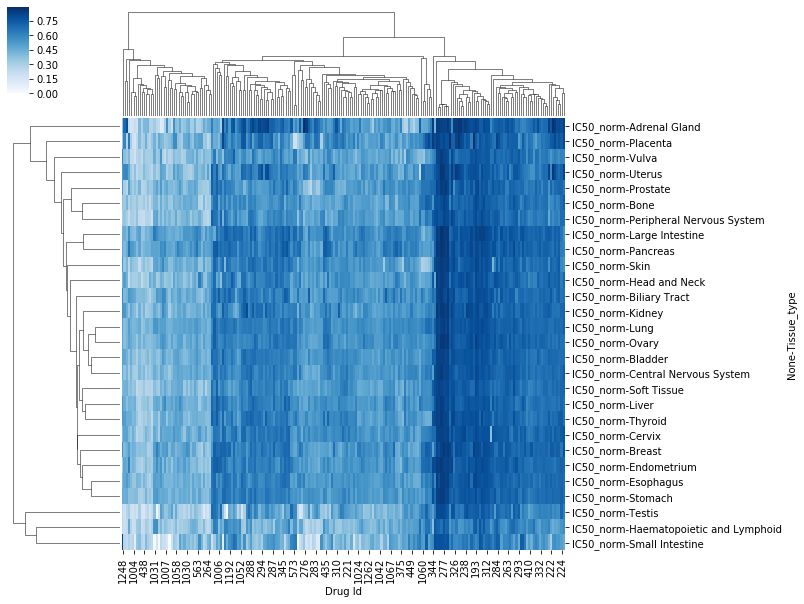

In [129]:
sns.clustermap(ic50_by_tissue_meta.T, cmap='Blues')

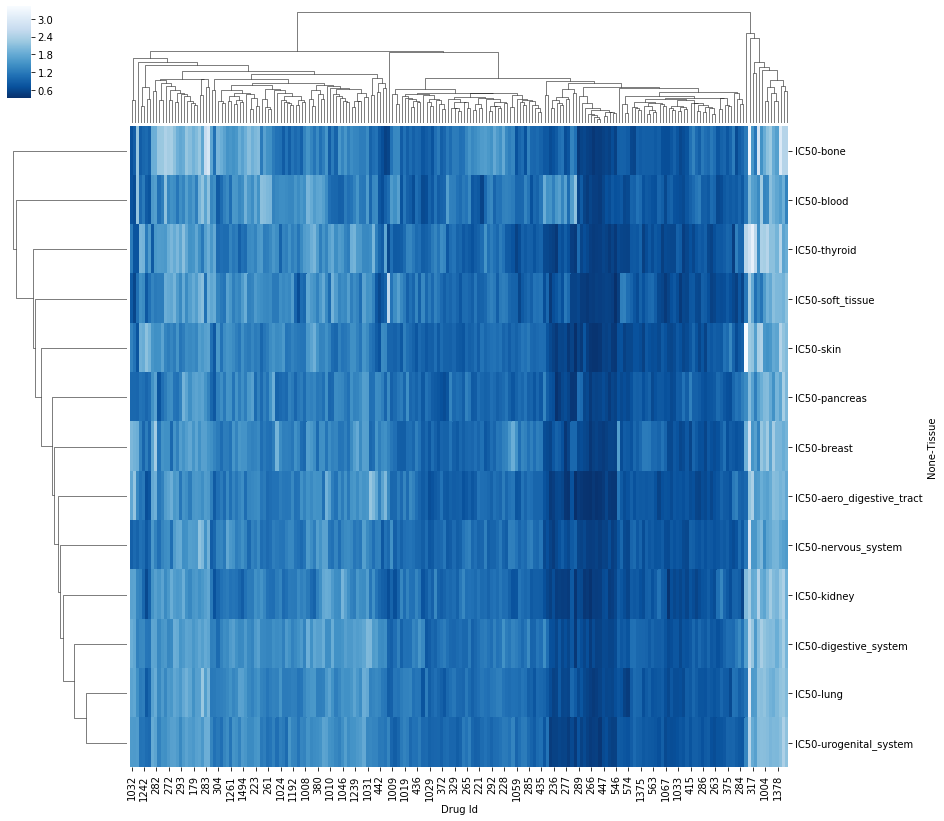

In [214]:
ic50_by_tissue = ic50_selected[['Drug Id', 'Cell line name','Tissue', 'IC50']].drop_duplicates()
ic50_by_tissue = ic50_by_tissue.groupby(['Drug Id', 'Tissue'])['IC50'].std().reset_index()

ic50_by_tissue = pd.pivot(ic50_by_tissue, index='Drug Id', columns='Tissue')
sns.clustermap(ic50_by_tissue.T, cmap='Blues_r',figsize=(14,14))

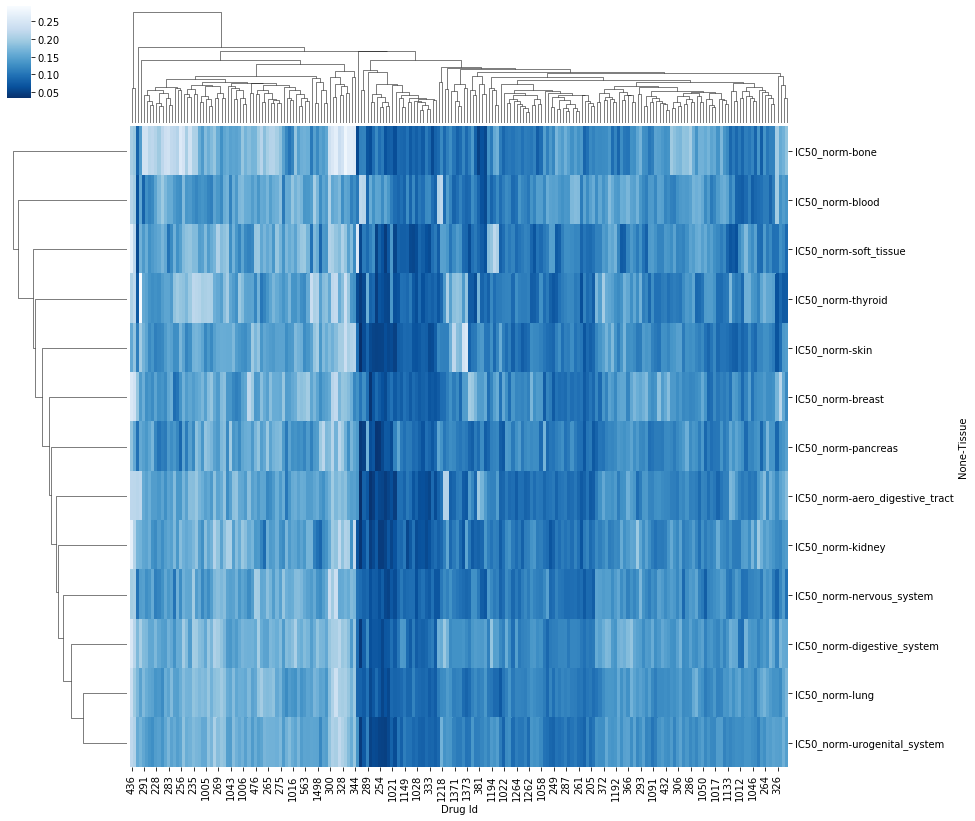

In [212]:
ic50_by_tissue = ic50_selected[['Drug Id', 'Cell line name','Tissue', 'IC50_norm']].drop_duplicates()
ic50_by_tissue = ic50_by_tissue.groupby(['Drug Id', 'Tissue'])['IC50_norm'].std().reset_index()

ic50_by_tissue = pd.pivot(ic50_by_tissue, index='Drug Id', columns='Tissue')
sns.clustermap(ic50_by_tissue.T, cmap='Blues_r',figsize=(14,14))

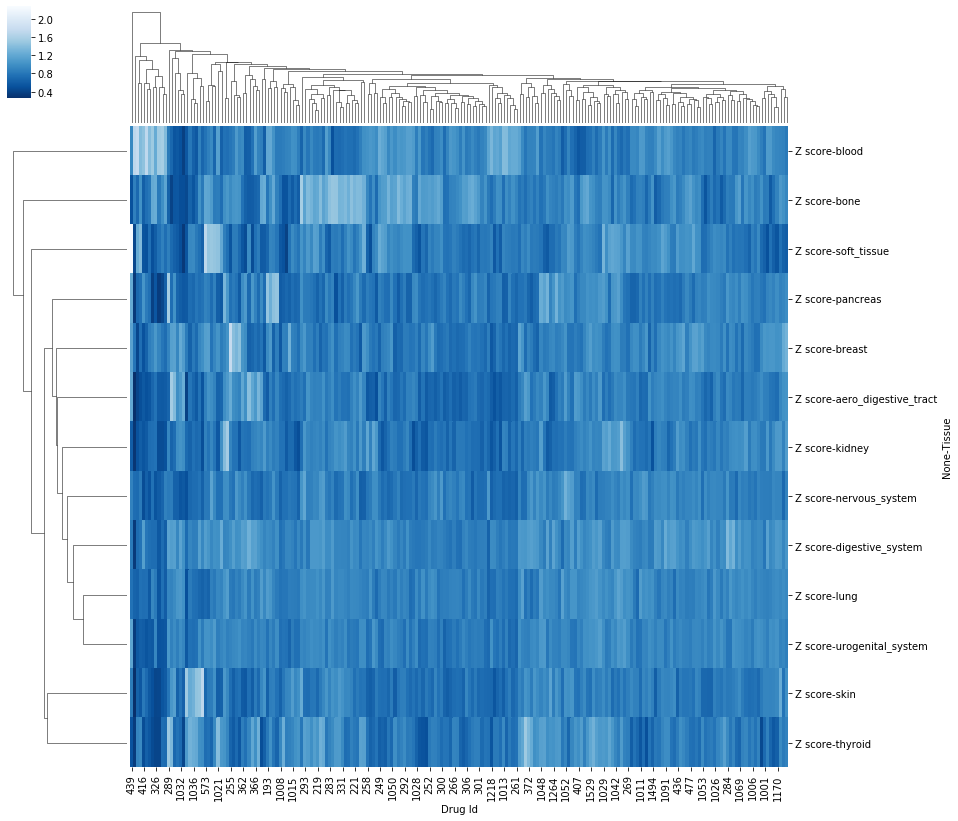

In [215]:
ic50_by_tissue = ic50_selected[['Drug Id', 'Cell line name','Tissue', 'Z score']].drop_duplicates()
ic50_by_tissue = ic50_by_tissue.groupby(['Drug Id', 'Tissue'])['Z score'].std().reset_index()

ic50_by_tissue = pd.pivot(ic50_by_tissue, index='Drug Id', columns='Tissue')
sns.clustermap(ic50_by_tissue.T, cmap='Blues_r',figsize=(14,14))

(array([ 0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12]),
 <a list of 13 Text xticklabel objects>)

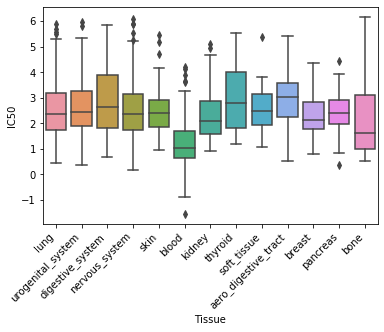

In [81]:
sns.boxplot(x='Tissue', y='IC50', data=ic50_selected[ic50_selected['Drug Id']==152])
plt.xticks(rotation=45, ha='right')

(array([ 0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12]),
 <a list of 13 Text xticklabel objects>)

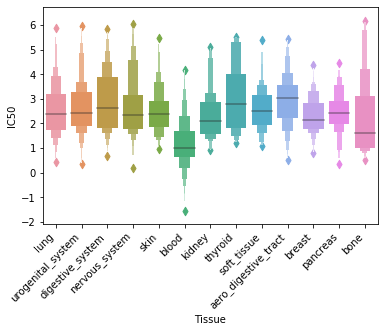

In [84]:
sns.boxenplot(x='Tissue', y='IC50', data=ic50_selected[ic50_selected['Drug Id']==152])
plt.xticks(rotation=45, ha='right')

In [ ]:
fig, ax = plt.subplots((ic50['Drug Id'].unique().size - 1) // 4 + 1,
                       4,
                       figsize=(15, 4 * 100))
count = 0
for drug_id in ic50['Drug Id'].unique():
    drug_id_ic50 = ic50[ic50['Drug Id'] == drug_id]['IC50'].values
    sns.distplot(drug_id_ic50, ax=ax[count // 4, count % 4], label=drug_id)
    ax[count // 4, count % 4].set_xlabel(f"Drug: {drug_id}")
    count += 1
plt.show()